In [1]:
!pip install fredapi


In [2]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import plotly.express as px 

plt.style.use('fivethirtyeight')
pd.set_option('display.max_columns',500)
color_pal = plt.rcParams["axes.prop_cycle"].by_key()["color"]
from fredapi import Fred

In [3]:
fred_key = "70cb1f032f619f01a1fdb530ec327f1a"

# 1. Create the Fred Object 


In [4]:
fred = Fred(api_key=fred_key)

# 2. Search For economic data

In [5]:
sp_search = fred.search('S&P', order_by = 'popularity')

In [6]:
sp_search.shape

(1000, 15)

In [7]:
sp_search.head()

,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
BAMLH0A0HYM2,BAMLH0A0HYM2,2024-07-02,2024-07-02,ICE BofA US High Yield Index Option-Adjusted S...,1996-12-31,2024-06-30,"Daily, Close",D,Percent,%,Not Seasonally Adjusted,NSA,2024-07-01 08:06:06-05:00,92,The ICE BofA Option-Adjusted Spreads (OASs) ar...
CSUSHPINSA,CSUSHPINSA,2024-07-02,2024-07-02,S&P CoreLogic Case-Shiller U.S. National Home ...,1987-01-01,2024-04-01,Monthly,M,Index Jan 2000=100,Index Jan 2000=100,Not Seasonally Adjusted,NSA,2024-06-25 08:12:01-05:00,88,"For more information regarding the index, plea..."
SP500,SP500,2024-07-02,2024-07-02,S&P 500,2014-07-02,2024-07-01,"Daily, Close",D,Index,Index,Not Seasonally Adjusted,NSA,2024-07-01 19:28:08-05:00,83,The observations for the S&P 500 represent the...
MEHOINUSA672N,MEHOINUSA672N,2024-07-02,2024-07-02,Real Median Household Income in the United States,1984-01-01,2022-01-01,Annual,A,2022 CPI-U-RS Adjusted Dollars,2022 CPI-U-RS Adjusted $,Not Seasonally Adjusted,NSA,2023-09-12 13:48:02-05:00,83,Household data are collected as of March. As ...
BAMLH0A0HYM2EY,BAMLH0A0HYM2EY,2024-07-02,2024-07-02,ICE BofA US High Yield Index Effective Yield,1996-12-31,2024-06-30,"Daily, Close",D,Percent,%,Not Seasonally Adjusted,NSA,2024-07-01 08:06:09-05:00,82,This data represents the effective yield of th...


# Pull Raw Data and Plot

In [8]:
sp500 = fred.get_series(series_id = 'SP500')

<Axes: title={'center': 'S&P 500'}>

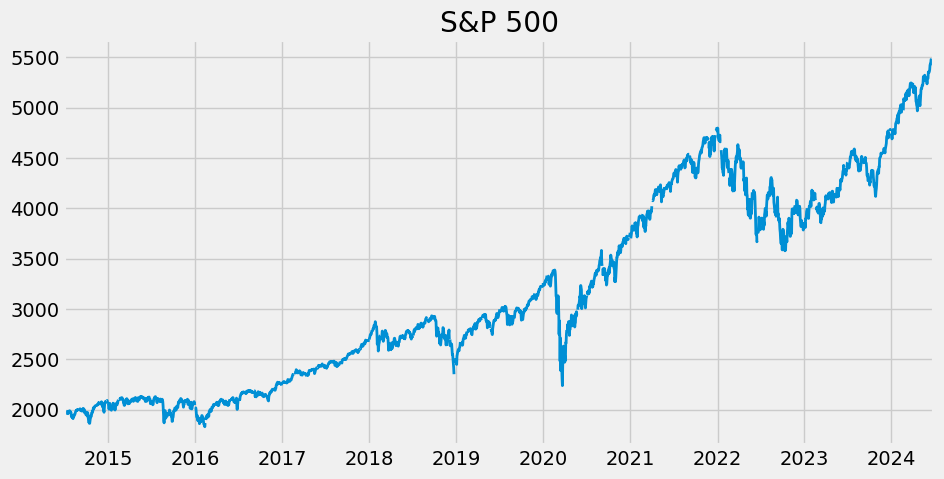

In [9]:
sp500.plot(figsize= (10,5), title = 'S&P 500',lw=2)

# 4. Pull and Join Multiple Data Series

In [10]:
uemp_results= fred.search('unemployement')

In [11]:
uemp_results

,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
UNRATE,UNRATE,2024-07-02,2024-07-02,Unemployment Rate,1948-01-01,2024-05-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-06-07 07:51:02-05:00,95,The unemployment rate represents the number of...
UNRATENSA,UNRATENSA,2024-07-02,2024-07-02,Unemployment Rate,1948-01-01,2024-05-01,Monthly,M,Percent,%,Not Seasonally Adjusted,NSA,2024-06-07 07:50:02-05:00,58,The unemployment rate represents the number of...
UNEMPLOY,UNEMPLOY,2024-07-02,2024-07-02,Unemployment Level,1948-01-01,2024-05-01,Monthly,M,Thousands of Persons,Thous. of Persons,Seasonally Adjusted,SA,2024-06-07 07:51:06-05:00,71,The series comes from the 'Current Population ...
NROU,NROU,2024-07-02,2024-07-02,Noncyclical Rate of Unemployment,1949-01-01,2034-10-01,Quarterly,Q,Percent,%,Not Seasonally Adjusted,NSA,2024-07-01 12:01:04-05:00,69,"Starting with the July, 2021 report: An Update..."
CCSA,CCSA,2024-07-02,2024-07-02,Continued Claims (Insured Unemployment),1967-01-07,2024-06-15,"Weekly, Ending Saturday",W,Number,Number,Seasonally Adjusted,SA,2024-06-27 07:33:04-05:00,74,"Continued claims, also referred to as insured ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LAUCN340030000000003A,LAUCN340030000000003A,2024-07-02,2024-07-02,"Unemployment Rate in Bergen County, NJ",1990-01-01,2023-01-01,Annual,A,Percent,%,Not Seasonally Adjusted,NSA,2024-05-01 10:48:38-05:00,0,These data come from the Current Population Su...
LMUNRRTTLUM156S,LMUNRRTTLUM156S,2024-07-02,2024-07-02,Infra-Annual Registered Unemployment and Job V...,1995-01-01,2023-12-01,Monthly,M,Growth rate previous period,Growth rate previous period,Seasonally Adjusted,SA,2024-04-10 11:07:38-05:00,5,OECD Data Filters: REF_AREA: LUX MEASURE: REG...
LNS14000315,LNS14000315,2024-07-02,2024-07-02,Unemployment Rate - Married Women,1955-01-01,2024-05-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-06-07 07:51:42-05:00,9,To obtain estimates of women worker employment...


In [12]:
fred.search('unemployment state')

,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
UNRATE,UNRATE,2024-07-02,2024-07-02,Unemployment Rate,1948-01-01,2024-05-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-06-07 07:51:02-05:00,95,The unemployment rate represents the number of...
UNRATENSA,UNRATENSA,2024-07-02,2024-07-02,Unemployment Rate,1948-01-01,2024-05-01,Monthly,M,Percent,%,Not Seasonally Adjusted,NSA,2024-06-07 07:50:02-05:00,58,The unemployment rate represents the number of...
CCSA,CCSA,2024-07-02,2024-07-02,Continued Claims (Insured Unemployment),1967-01-07,2024-06-15,"Weekly, Ending Saturday",W,Number,Number,Seasonally Adjusted,SA,2024-06-27 07:33:04-05:00,74,"Continued claims, also referred to as insured ..."
CCNSA,CCNSA,2024-07-02,2024-07-02,Continued Claims (Insured Unemployment),1967-01-07,2024-06-15,"Weekly, Ending Saturday",W,Number,Number,Not Seasonally Adjusted,NSA,2024-06-27 07:33:08-05:00,39,"Continued claims, also referred to as insured ..."
UNEMPLOY,UNEMPLOY,2024-07-02,2024-07-02,Unemployment Level,1948-01-01,2024-05-01,Monthly,M,Thousands of Persons,Thous. of Persons,Seasonally Adjusted,SA,2024-06-07 07:51:06-05:00,71,The series comes from the 'Current Population ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LAUCN518000000000004A,LAUCN518000000000004A,2024-07-02,2024-07-02,"Unemployed Persons in Suffolk City, VA",1990-01-01,2023-01-01,Annual,A,Persons,Persons,Not Seasonally Adjusted,NSA,2024-05-01 10:25:10-05:00,3,These data come from the Current Population Su...
LAUCN540650000000004A,LAUCN540650000000004A,2024-07-02,2024-07-02,"Unemployed Persons in Morgan County, WV",1990-01-01,2023-01-01,Annual,A,Persons,Persons,Not Seasonally Adjusted,NSA,2024-05-01 10:24:20-05:00,3,These data come from the Current Population Su...
LAUCN540650000000004,LAUCN540650000000004,2024-07-02,2024-07-02,"Unemployed Persons in Morgan County, WV",1990-01-01,2024-04-01,Monthly,M,Persons,Persons,Not Seasonally Adjusted,NSA,2024-05-29 10:25:15-05:00,3,These data come from the Current Population Su...


In [13]:
unrate = fred.get_series('UNRATE')

<Axes: >

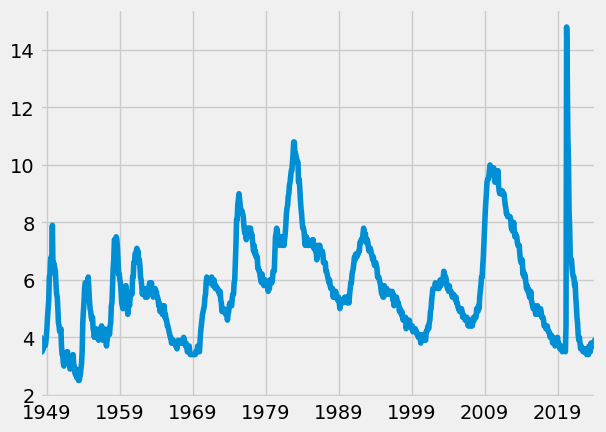

In [14]:
unrate.plot()

In [15]:
fred.search('unemplyement rate state', filter=('frequency','Monthly'))

In [16]:
unemp_df= fred.search('unemployment rate state', filter=('frequency', 'Monthly'))

In [17]:
unemp_df

,id,realtime_start,realtime_end,title,observation_start,observation_end,frequency,frequency_short,units,units_short,seasonal_adjustment,seasonal_adjustment_short,last_updated,popularity,notes
series id,,,,,,,,,,,,,,,
UNRATE,UNRATE,2024-07-02,2024-07-02,Unemployment Rate,1948-01-01,2024-05-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-06-07 07:51:02-05:00,95,The unemployment rate represents the number of...
UNRATENSA,UNRATENSA,2024-07-02,2024-07-02,Unemployment Rate,1948-01-01,2024-05-01,Monthly,M,Percent,%,Not Seasonally Adjusted,NSA,2024-06-07 07:50:02-05:00,58,The unemployment rate represents the number of...
LNS14000006,LNS14000006,2024-07-02,2024-07-02,Unemployment Rate - Black or African American,1972-01-01,2024-05-01,Monthly,M,Percent,%,Seasonally Adjusted,SA,2024-06-07 07:51:04-05:00,72,The series comes from the 'Current Population ...
UNEMPLOY,UNEMPLOY,2024-07-02,2024-07-02,Unemployment Level,1948-01-01,2024-05-01,Monthly,M,Thousands of Persons,Thous. of Persons,Seasonally Adjusted,SA,2024-06-07 07:51:06-05:00,71,The series comes from the 'Current Population ...
LNU04000006,LNU04000006,2024-07-02,2024-07-02,Unemployment Rate - Black or African American,1972-01-01,2024-05-01,Monthly,M,Percent,%,Not Seasonally Adjusted,NSA,2024-06-07 07:50:07-05:00,23,The series comes from the 'Current Population ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LNU04032220,LNU04032220,2024-07-02,2024-07-02,Unemployment Rate - Sales and Related Occupations,2000-01-01,2024-05-01,Monthly,M,Percent,%,Not Seasonally Adjusted,NSA,2024-06-07 07:50:40-05:00,4,The series comes from the 'Current Population ...
SCMARI7URN,SCMARI7URN,2024-07-02,2024-07-02,"Unemployment Rate in Marion County, SC",1990-01-01,2024-04-01,Monthly,M,Percent,%,Not Seasonally Adjusted,NSA,2024-05-29 10:09:09-05:00,4,These data come from the Current Population Su...
VAALBE7URN,VAALBE7URN,2024-07-02,2024-07-02,"Unemployment Rate in Albemarle County, VA",1990-01-01,2024-04-01,Monthly,M,Percent,%,Not Seasonally Adjusted,NSA,2024-05-29 10:24:11-05:00,4,These data come from the Current Population Su...


In [18]:
unemp_df = unemp_df.query('seasonal_adjustment == "Seasonally Adjusted" and units == "Percent"')

In [19]:
unemp_df = unemp_df.loc[unemp_df['title'].str.contains('Unemployment Rate')]

In [20]:
len(unemp_df.index)

99

In [21]:
all_results = []

for myid in unemp_df.index:
    results = fred.get_series(myid)
    results = results.to_frame(name=myid)
    all_results.append(results)

In [23]:
all_results


[            UNRATE
 1948-01-01     3.4
 1948-02-01     3.8
 1948-03-01     4.0
 1948-04-01     3.9
 1948-05-01     3.5
 ...            ...
 2024-01-01     3.7
 2024-02-01     3.9
 2024-03-01     3.8
 2024-04-01     3.9
 2024-05-01     4.0
 
 [917 rows x 1 columns],
             LNS14000006
 1972-01-01         11.2
 1972-02-01         11.2
 1972-03-01         10.7
 1972-04-01          9.8
 1972-05-01         10.2
 ...                 ...
 2024-01-01          5.3
 2024-02-01          5.6
 2024-03-01          6.4
 2024-04-01          5.6
 2024-05-01          6.1
 
 [629 rows x 1 columns],
             CAUR
 1976-01-01   9.2
 1976-02-01   9.2
 1976-03-01   9.1
 1976-04-01   9.1
 1976-05-01   9.0
 ...          ...
 2024-01-01   5.2
 2024-02-01   5.3
 2024-03-01   5.3
 2024-04-01   5.3
 2024-05-01   5.2
 
 [581 rows x 1 columns],
             TXUR
 1976-01-01   5.8
 1976-02-01   5.8
 1976-03-01   5.9
 1976-04-01   5.9
 1976-05-01   5.9
 ...          ...
 2024-01-01   3.9
 2024-02-01   3.9
 

In [33]:
unemp_results = pd.concat(all_results, axis =1)

In [39]:
unemp_states = unemp_results.drop('UNRATE', axis = 1)

<Axes: >

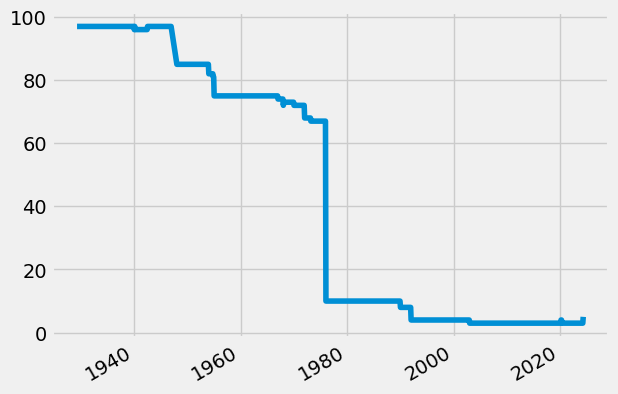

In [40]:
unemp_states.isna().sum(axis=1).plot()

In [41]:
unemp_states

,LNS14000006,CAUR,TXUR,M0892AUSM156SNBR,LNS14000024,LNS14000031,M0892BUSM156SNBR,NYUR,U2RATE,FLUR,LNS14000002,LNS14000009,LNS14000003,PAUR,OHUR,LNS14000001,LNS14027660,MIUR,LNS14027662,ALUR,LNS14024887,MAUR,NCUR,ILUR,NJUR,GAUR,COUR,AZUR,WIUR,VAUR,KYUR,LRUN64TTUSM156S,SCUR,NMUR,MNUR,TNUR,LNS14032183,LNS14000012,WAUR,LNS14027659,MDUR,ORUR,WVUR,NVUR,ARUR,OKUR,MOUR,AKUR,IAUR,UTUR,PRUR,INUR,LAUR,HIUR,LASMT261982000000003,NDUR,MTUR,DCUR,MSUR,LNS14000060,LNS14000028,MEUR,NEUR,LASMT391746000000003,CTUR,IDUR,NHUR,LNS14000018,RIUR,KSUR,WYUR,DEUR,LNS14000036,VTUR,LNS14000032,SDUR,CMWRUR,LNS14200000,LRUN24TTUSM156S,LNS14027689,LNS14100000,LNS14000315,LNS14000029,LRHUTTTTUSM156S,LNS14024230,CSOUUR,LNS14000025,LNS14000061,CNERUR,LRUNTTTTUSM156S,CWSTUR,CNEWUR,LNS14000026,LNS14000048,LNS14000089,M08311USM156SNBR,LNS14000150,LRUN25TTUSM156S
1929-04-01,NaN,NaN,NaN,0.69,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1929-05-01,NaN,NaN,NaN,1.65,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1929-06-01,NaN,NaN,NaN,2.06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1929-07-01,NaN,NaN,NaN,0.79,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1929-08-01,NaN,NaN,NaN,0.04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-01-01,5.3,5.2,3.9,NaN,3.4,5.3,NaN,4.5,1.8,3.1,3.4,5.0,3.4,3.4,3.7,3.9,4.3,4.0,2.1,2.9,7.3,3.0,3.5,4.7,4.8,3.1,3.4,4.2,3.2,3.0,4.3,3.745523,3.0,4.0,2.7,3.5,2.9,10.6,4.6,6.0,2.3,4.1,4.3,5.3,3.7,3.5,3.3,4.6,3.0,2.8,5.7,3.5,4.1,3.1,3.9,1.9,3.3,5.0,3.2,3.3,3.3,3.4,2.5,3.8,4.4,3.3,2.6,11.6,3.6,2.6,2.8,4.1,5.9,2.3,4.8,2.1,3.6,4.2,7.3,3.3,3.6,2.0,2.9,3.7,2.9,3.4,3.6,3.4,4.0,3.7,4.6,3.4,3.2,3.2,3.9,NaN,2.1,3.3
2024-02-01,5.6,5.3,3.9,NaN,3.5,6.1,NaN,4.4,1.9,3.1,3.9,5.0,3.4,3.4,3.7,3.8,4.2,3.9,2.2,3.0,8.8,2.9,3.5,4.8,4.8,3.1,3.5,4.1,3.0,3.0,4.4,3.916297,3.1,3.9,2.7,3.3,3.4,12.5,4.7,6.1,2.4,4.2,4.3,5.2,3.6,3.6,3.3,4.6,3.0,2.8,5.7,3.5,4.2,3.1,3.8,2.0,3.4,5.1,3.1,3.3,3.1,3.4,2.5,3.8,4.5,3.3,2.6,15.4,3.9,2.7,2.8,4.0,7.2,2.3,4.4,2.1,3.6,3.9,8.8,3.1,

In [42]:
unemp_states

,LNS14000006,CAUR,TXUR,M0892AUSM156SNBR,LNS14000024,LNS14000031,M0892BUSM156SNBR,NYUR,U2RATE,FLUR,LNS14000002,LNS14000009,LNS14000003,PAUR,OHUR,LNS14000001,LNS14027660,MIUR,LNS14027662,ALUR,LNS14024887,MAUR,NCUR,ILUR,NJUR,GAUR,COUR,AZUR,WIUR,VAUR,KYUR,LRUN64TTUSM156S,SCUR,NMUR,MNUR,TNUR,LNS14032183,LNS14000012,WAUR,LNS14027659,MDUR,ORUR,WVUR,NVUR,ARUR,OKUR,MOUR,AKUR,IAUR,UTUR,PRUR,INUR,LAUR,HIUR,LASMT261982000000003,NDUR,MTUR,DCUR,MSUR,LNS14000060,LNS14000028,MEUR,NEUR,LASMT391746000000003,CTUR,IDUR,NHUR,LNS14000018,RIUR,KSUR,WYUR,DEUR,LNS14000036,VTUR,LNS14000032,SDUR,CMWRUR,LNS14200000,LRUN24TTUSM156S,LNS14027689,LNS14100000,LNS14000315,LNS14000029,LRHUTTTTUSM156S,LNS14024230,CSOUUR,LNS14000025,LNS14000061,CNERUR,LRUNTTTTUSM156S,CWSTUR,CNEWUR,LNS14000026,LNS14000048,LNS14000089,M08311USM156SNBR,LNS14000150,LRUN25TTUSM156S
1929-04-01,NaN,NaN,NaN,0.69,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1929-05-01,NaN,NaN,NaN,1.65,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1929-06-01,NaN,NaN,NaN,2.06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1929-07-01,NaN,NaN,NaN,0.79,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1929-08-01,NaN,NaN,NaN,0.04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-01-01,5.3,5.2,3.9,NaN,3.4,5.3,NaN,4.5,1.8,3.1,3.4,5.0,3.4,3.4,3.7,3.9,4.3,4.0,2.1,2.9,7.3,3.0,3.5,4.7,4.8,3.1,3.4,4.2,3.2,3.0,4.3,3.745523,3.0,4.0,2.7,3.5,2.9,10.6,4.6,6.0,2.3,4.1,4.3,5.3,3.7,3.5,3.3,4.6,3.0,2.8,5.7,3.5,4.1,3.1,3.9,1.9,3.3,5.0,3.2,3.3,3.3,3.4,2.5,3.8,4.4,3.3,2.6,11.6,3.6,2.6,2.8,4.1,5.9,2.3,4.8,2.1,3.6,4.2,7.3,3.3,3.6,2.0,2.9,3.7,2.9,3.4,3.6,3.4,4.0,3.7,4.6,3.4,3.2,3.2,3.9,NaN,2.1,3.3
2024-02-01,5.6,5.3,3.9,NaN,3.5,6.1,NaN,4.4,1.9,3.1,3.9,5.0,3.4,3.4,3.7,3.8,4.2,3.9,2.2,3.0,8.8,2.9,3.5,4.8,4.8,3.1,3.5,4.1,3.0,3.0,4.4,3.916297,3.1,3.9,2.7,3.3,3.4,12.5,4.7,6.1,2.4,4.2,4.3,5.2,3.6,3.6,3.3,4.6,3.0,2.8,5.7,3.5,4.2,3.1,3.8,2.0,3.4,5.1,3.1,3.3,3.1,3.4,2.5,3.8,4.5,3.3,2.6,15.4,3.9,2.7,2.8,4.0,7.2,2.3,4.4,2.1,3.6,3.9,8.8,3.1,

In [43]:
px.line(unemp_states)

In [44]:
## Pull April 2020 Unemployment rate per state 

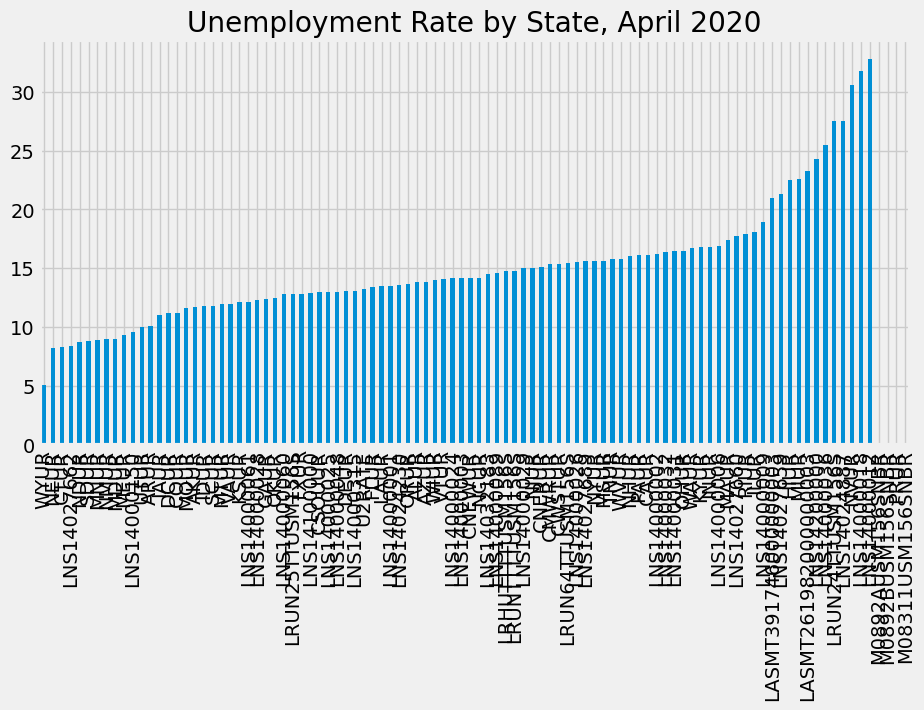

In [50]:
ax = unemp_states.loc[unemp_states.index == '2020-04-01'].T\
    .sort_values('2020-04-01')\
    .plot(kind='bar', figsize=(10,5),
          title = 'Unemployment Rate by State, April 2020')
ax.legend().remove()
plt.show()

In [56]:
id_to_state = unemp_df['title'].str.replace('Unemployment Rate in', '').to_dict()

In [59]:
unemp_states.columns = [id_to_state[c] for c in unemp_states.columns]

In [61]:
unemp_states

,Unemployment Rate - Black or African American,California,Texas,Unemployment Rate for United States,Unemployment Rate - 20 Yrs. & over,"Unemployment Rate - 20 Yrs. & over, Black or African American Men",Unemployment Rate for United States,New York,Unemployment Rate - Job Losers (U-2),Florida,Unemployment Rate - Women,Unemployment Rate - Hispanic or Latino,Unemployment Rate - White,Pennsylvania,Ohio,Unemployment Rate - Men,"Unemployment Rate - High School Graduates, No College, 25 Yrs. & over",Michigan,"Unemployment Rate - Bachelor's Degree and Higher, 25 Yrs. & over",Alabama,Unemployment Rate - 16-24 Yrs.,Massachusetts,North Carolina,Illinois,New Jersey,Georgia,Colorado,Arizona,Wisconsin,Virginia,Kentucky,Infra-Annual Labor Statistics: Unemployment Rate Total: From 15 to 64 Years for United States,South Carolina,New Mexico,Minnesota,Tennessee,Unemployment Rate - Asian,Unemployment Rate - 16-19 Yrs.,Washington,"Unemployment Rate - Less Than a High School Diploma, 25 Yrs. & over",Maryland,Oregon,West Virginia,Nevada,Arkansas,Oklahoma,Missouri,Alaska,Iowa,Utah,Puerto Rico,Indiana,Louisiana,Hawaii,"Detroit-Warren-Dearborn, MI (MSA)",North Dakota,Montana,the District of Columbia,Mississippi,Unemployment Rate - 25-54 Yrs.,"Unemployment Rate - 20 Yrs. & over, White Men",Maine,Nebraska,"Cleveland-Elyria, OH (MSA)",Connecticut,Idaho,New Hampshire,"Unemployment Rate - 16-19 Yrs., Black or African American",Rhode Island,Kansas,Wyoming,Delaware,Unemployment Rate - 20-24 Yrs.,Vermont,"Unemployment Rate - 20 Yrs. & over, Black or African American Women",South Dakota,Midwest Census Region,Unemployment Rate Part-Time Workers,Infra-Annual Labor Statistics: Unemployment Rate Total: From 15 to 24 Years for United States,"Unemployment Rate - Some College or Associate Degree, 25 Yrs. & over",Unemployment Rate Full-Time Workers,Unemployment Rate - Married Women,"Unemployment Rate - 20 Yrs. & over, White Women",Infra-Annual Labor Statistics: Monthly Unemployment Rate Total: 15 Years or over for United States,Unemployment Rate - 55 Yrs. & over,South Census Region,"Unemployment Rate - 20 Yrs. & over, Men","Unemployment Rate - 25-54 Yrs., Men",Northeast Census Region,Infra-Annual Labor Statistics: Unemployment Rate Total: 15 Years or over for United States,West Census Region,New England Census Division,"Unemployment Rate - 20 Yrs. & over, Women",Unemployment Rate - 25 Yrs. & over,Unemployment Rate - 25-34 Yrs.,"Unemployment Rate, Married Males, Spouse Present for United States",Unemployment Rate - Married Men,Infra-Annual Labor Statistics: Unemployment Rate Total: From 25 to 54 Years for United States
1929-04-01,NaN,NaN,NaN,0.69,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1929-05-01,NaN,NaN,NaN,1.65,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1929-06-01,NaN,NaN,NaN,2.06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1929-07-01,NaN,NaN,NaN,0.79,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N

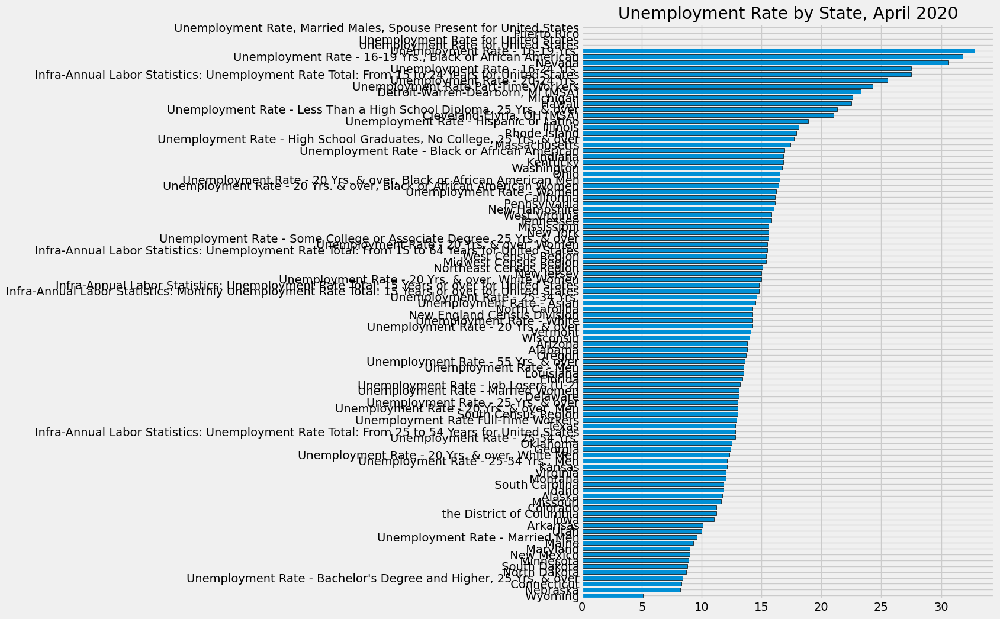

In [63]:
ax = unemp_states.loc[unemp_states.index == '2020-04-01'].T\
    .sort_values('2020-04-01')\
    .plot(kind='barh', figsize=(8,12), width = 0.7, edgecolor = 'black',
          title = 'Unemployment Rate by State, April 2020')
ax.legend().remove()
plt.show()

In [64]:
## Pull Participation Rate 

In [66]:
part_df = fred.search('participation rate state', filter = ('frequency', 'Monthly'))
part_df = part_df.query('seasonal_adjustment == "Seasonally Adjusted" and units == "Percent"')

In [68]:
part_df.shape

(109, 15)

In [69]:
part_id_to_state = part_df['title'].str.replace('Labor force participation rate for', '').to_dict()

all_results = []

for myid in part_df.index:
    results = fred.get_series(myid)
    results = results.to_frame(name=myid)
    all_results.append(results)
part_states = pd.concat(all_results, axis=1)
part_states.columns = [part_id_to_state[c] for c in part_states.columns]

In [70]:
# plot unemployment vs participation 

<Axes: >

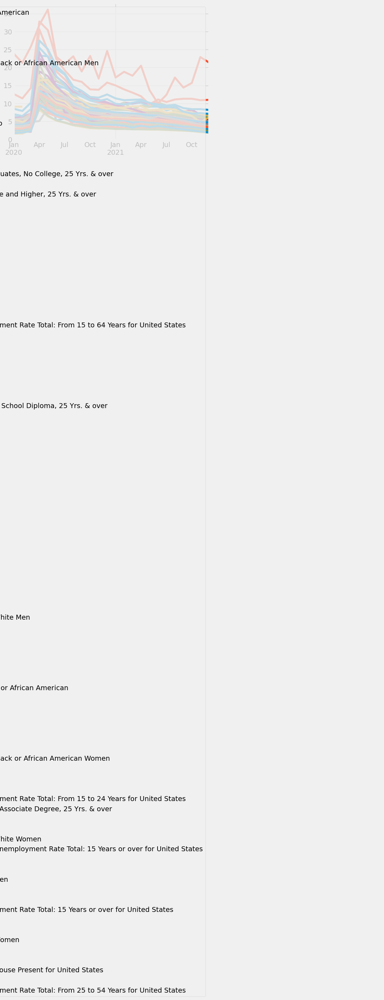

In [73]:
unemp_states.query('index >= 2020 and index < 2022').plot()

KeyError: 'New York'

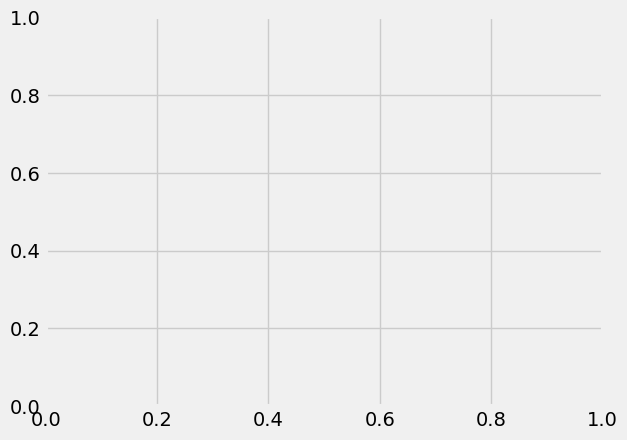

In [74]:
fig, ax = plt.subplots()
part_states.query('index >= 2020 and index < 2022')['New York'].plot(ax=ax)